# Wk18 Lecture02 CodeAlong: UFOs

## Learning Objectives

- By the end of this CodeAlong, students will be able to:
   - Calculate time series statistics (rolling mean/std/diff/pct_change
   - Aggregate time series use date parts
   - Identify seasonality
    

## 📝 **Stakeholder Questions to Answer**

- 1) What Month/Year had the most sightings? (and how many sightings were there?)

- Which year had the highest % increase in sightings compared to previous years?

- 2) Which month of the year has the highest number of reported sightings?

- 2) What day of the week has the highest reported sightings?

- 3) At what time of day (hour) do most sightings occur?

- 4) Which US state has the most sightings?

- 5) Which US State has seen the biggest % increase in sightings since 1990?

- 4) Which US holiday has the largest number of sightings?

- 5) Which country had the largest proportion of sightings for the year 2000?

- 6) Have the types/shapes of UFO's witness changed over time?

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticks

import missingno as miss

import seaborn as sns
import numpy as np
# import statsmodels.tsa.api as tsa

In [2]:
import datetime as dt

# 🕹️Part 1) Preparing Irregular-Interval Time Series

### Overview from Last Lecture

- 1) [ ] Convert the dates & times to a single column (if needed).
- 2) [ ] Convert the datetime column  (most likely a string) to a datetime data type.
- 3) [ ] Set the datetime column as the Series/DataFrame index
- 4) [ ] Resample the time series to the desired/correct frequency using the desired/correct aggregation method.
- 5) [ ] Impute null values (if required)


### UFO Sightings

- UFO Sightings: https://www.kaggle.com/datasets/NUFORC/ufo-sightings 

In [3]:
ufo  = pd.read_csv("Data/ufos-kaggle/scrubbed.csv", low_memory=False)
ufo

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
3,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
4,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611
...,...,...,...,...,...,...,...,...,...,...,...
80327,9/9/2013 21:15,nashville,tn,us,light,600,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.1658333,-86.784444
80328,9/9/2013 22:00,boise,id,us,circle,1200,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.6136111,-116.202500
80329,9/9/2013 22:00,napa,ca,us,other,1200,hour,Napa UFO&#44,9/30/2013,38.2972222,-122.284444
80330,9/9/2013 22:20,vienna,va,us,circle,5,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.9011111,-77.265556


In [4]:
ufo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80332 entries, 0 to 80331
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   datetime              80332 non-null  object 
 1   city                  80332 non-null  object 
 2   state                 74535 non-null  object 
 3   country               70662 non-null  object 
 4   shape                 78400 non-null  object 
 5   duration (seconds)    80332 non-null  object 
 6   duration (hours/min)  80332 non-null  object 
 7   comments              80317 non-null  object 
 8   date posted           80332 non-null  object 
 9   latitude              80332 non-null  object 
 10  longitude             80332 non-null  float64
dtypes: float64(1), object(10)
memory usage: 6.7+ MB


>- 1) [x] Convert the dates & times to a single column (if needed).

## Preparing the Datetime Index

### Converting Date Cols to Datetime

In [5]:
try:
    ufo['datetime'] = pd.to_datetime(ufo["datetime"])
    display(ufo.head())
except Exception as e:
    display(e)

ParserError('hour must be in 0..23: 10/11/2006 24:00 present at position 388')

### Handling Errors with pd.to_datetime

- Can use the `errors` argument for pd.to_datetime:
    - "raise" (default): raise an exception when errors happen
    - 'ignore': ignores the errors and returns the original value for that row. 
        - NOT RECOMMENDED: the entire column will not be datetime.
    - 'coerce': convert any bad datetime values to null values (NaT - NotATime)

>- **Branch point: we have a choice on how we deal with the bad timestamps.**
    -  Do we coerce them, make then null values, and drop them? Potentially losing a lot of data.
    - Or do we investigate a bit more to see if we can fix the problem without losing data.
    
    
- Let's see how much data we would lose if we chose to coerce the bad values:

In [6]:
##check nulls before coercing errors
ufo.isna().sum()

datetime                   0
city                       0
state                   5797
country                 9670
shape                   1932
duration (seconds)         0
duration (hours/min)       0
comments                  15
date posted                0
latitude                   0
longitude                  0
dtype: int64

In [7]:
## saving a copy of original datetime column
ufo['datetime-original'] = ufo['datetime'].copy()
ufo

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,datetime-original
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111,10/10/1949 20:30
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082,10/10/1949 21:00
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667,10/10/1955 17:00
3,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833,10/10/1956 21:00
4,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611,10/10/1960 20:00
...,...,...,...,...,...,...,...,...,...,...,...,...
80327,9/9/2013 21:15,nashville,tn,us,light,600,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.1658333,-86.784444,9/9/2013 21:15
80328,9/9/2013 22:00,boise,id,us,circle,1200,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.6136111,-116.202500,9/9/2013 22:00
80329,9/9/2013 22:00,napa,ca,us,other,1200,hour,Napa UFO&#44,9/30/2013,38.2972222,-122.284444,9/9/2013 22:00
80330,9/9/2013 22:20,vienna,va,us,circle,5,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.9011111,-77.265556,9/9/2013 22:20


In [8]:
## Using errors = "coerce"
ufo["datetime-coerce"] = pd.to_datetime(ufo["datetime"], errors='coerce')
ufo["datetime-coerce"]

0       1949-10-10 20:30:00
1       1949-10-10 21:00:00
2       1955-10-10 17:00:00
3       1956-10-10 21:00:00
4       1960-10-10 20:00:00
                ...        
80327   2013-09-09 21:15:00
80328   2013-09-09 22:00:00
80329   2013-09-09 22:00:00
80330   2013-09-09 22:20:00
80331   2013-09-09 23:00:00
Name: datetime-coerce, Length: 80332, dtype: datetime64[ns]

In [9]:
## How many null values did we create?
ufo.isna().sum()

datetime                   0
city                       0
state                   5797
country                 9670
shape                   1932
duration (seconds)         0
duration (hours/min)       0
comments                  15
date posted                0
latitude                   0
longitude                  0
datetime-original          0
datetime-coerce          694
dtype: int64

<AxesSubplot: >

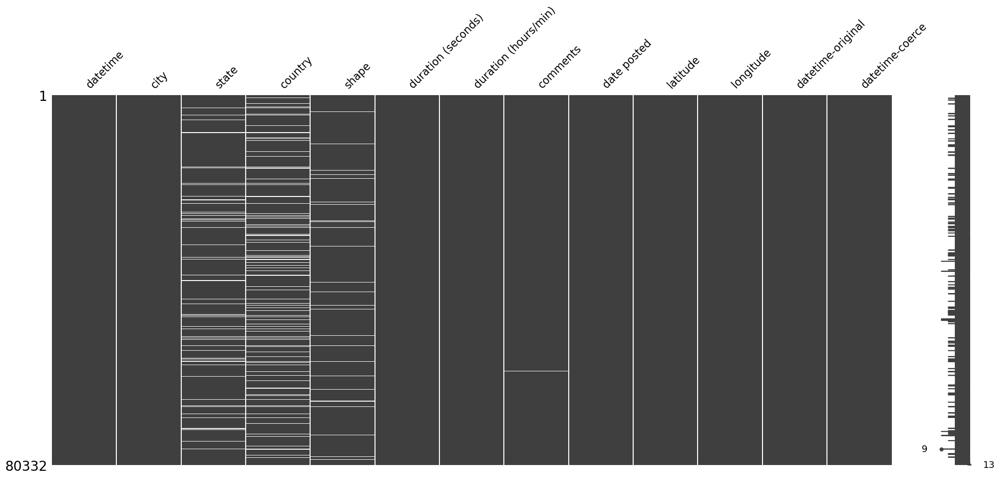

In [10]:
import missingno as miss
miss.matrix(ufo)

In [11]:
## inspecting just the bad rows
bad_rows = ufo[ufo['datetime-coerce'].isna()]
bad_rows

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,datetime-original,datetime-coerce
388,10/11/2006 24:00,rome,ny,us,oval,120,a min or two,I was walking from the garage to the house&#44...,2/1/2007,43.2127778,-75.456111,10/11/2006 24:00,NaT
693,10/1/2001 24:00,chulucanas-piura la vieja (peru),NaN,NaN,other,6312000,2 years,go to: http://www.24horas.com.pe/data/videos/...,3/4/2003,-5.129547,-80.120569,10/1/2001 24:00,NaT
962,10/1/2012 24:00,novi,mi,us,triangle,300,5 minutes,V shaped and 8 big and very brite lights&#44mo...,10/30/2012,42.4805556,-83.475556,10/1/2012 24:00,NaT
1067,10/12/2003 24:00,salatiga (indonesia),NaN,NaN,disk,22,22 seconds,UFO in Salatiga&#44Indonesia,10/31/2003,-7.33683,110.498817,10/12/2003 24:00,NaT
1221,10/12/2013 24:00,cincinnati,oh,us,fireball,300,3-5 minutes,A bright orange light split into four&#44 did ...,10/14/2013,39.1619444,-84.456944,10/12/2013 24:00,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...
79136,9/4/2005 24:00,boonville,nc,us,cigar,10800,3+ hours,Unusual activity in our small community&#44 cr...,9/9/2013,36.2325000,-80.708333,9/4/2005 24:00,NaT
79137,9/4/2005 24:00,redondo beach,ca,us,triangle,300,5 minutes,Triangulat UFO seen over Redondo Beach&#44 Cal...,12/16/2005,33.8491667,-118.387500,9/4/2005 24:00,NaT
79740,9/7/2002 24:00,portsmouth,oh,us,changing,900,15 minutes,A bright red light hoovering in the sky.,9/13/2002,38.7316667,-82.997778,9/7/2002 24:00,NaT
79759,9/7/2004 24:00,montrose,co,us,unknown,1200,20 minutes,Stationary object with three pulsating lights ...,9/9/2004,38.4783333,-107.875556,9/7/2004 24:00,NaT


In [12]:
## let's try to convert the bad rows again
try:
    pd.to_datetime(bad_rows['datetime-original'])
except Exception as e:
    display(e)

ParserError('hour must be in 0..23: 10/11/2006 24:00 present at position 0')

> 🤔"`ParserError: hour must be in 0..23: 10/11/2006 24:00 present at position 0`"

In [13]:
bad_rows['datetime-original']

388      10/11/2006 24:00
693       10/1/2001 24:00
962       10/1/2012 24:00
1067     10/12/2003 24:00
1221     10/12/2013 24:00
               ...       
79136      9/4/2005 24:00
79137      9/4/2005 24:00
79740      9/7/2002 24:00
79759      9/7/2004 24:00
79942      9/8/2003 24:00
Name: datetime-original, Length: 694, dtype: object

> Panda's is confused by 24:00. It doesn't know if we mean 0:00 of the NEXT day or if we mean the 11:59 pm (23:59) the same day

In [14]:
## replace 24:00 with 23:59
ufo['datetime-fixed'] = ufo["datetime-original"].str.replace(" 24:00"," 23:59")
ufo

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,datetime-original,datetime-coerce,datetime-fixed
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111,10/10/1949 20:30,1949-10-10 20:30:00,10/10/1949 20:30
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082,10/10/1949 21:00,1949-10-10 21:00:00,10/10/1949 21:00
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667,10/10/1955 17:00,1955-10-10 17:00:00,10/10/1955 17:00
3,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833,10/10/1956 21:00,1956-10-10 21:00:00,10/10/1956 21:00
4,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611,10/10/1960 20:00,1960-10-10 20:00:00,10/10/1960 20:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80327,9/9/2013 21:15,nashville,tn,us,light,600,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.1658333,-86.784444,9/9/2013 21:15,2013-09-09 21:15:00,9/9/2013 21:15
80328,9/9/2013 22:00,boise,id,us,circle,1200,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.6136111,-116.202500,9/9/2013 22:00,2013-09-09 22:00:00,9/9/2013 22:00
80329,9/9/2013 22:00,napa,ca,us,other,1200,hour,Napa UFO&#44,9/30/2013,38.2972222,-122.284444,9/9/2013 22:00,2013-09-09 22:00:00,9/9/2013 22:00
80330,9/9/2013 22:20,vienna,va,us,circle,5,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.9011111,-77.265556,9/9/2013 22:20,2013-09-09 22:20:00,9/9/2013 22:20


In [15]:
## use the fixed-datetime column to make the datetime col
ufo['datetime'] = pd.to_datetime(ufo["datetime-fixed"])
ufo

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,datetime-original,datetime-coerce,datetime-fixed
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111,10/10/1949 20:30,1949-10-10 20:30:00,10/10/1949 20:30
1,1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082,10/10/1949 21:00,1949-10-10 21:00:00,10/10/1949 21:00
2,1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667,10/10/1955 17:00,1955-10-10 17:00:00,10/10/1955 17:00
3,1956-10-10 21:00:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833,10/10/1956 21:00,1956-10-10 21:00:00,10/10/1956 21:00
4,1960-10-10 20:00:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611,10/10/1960 20:00,1960-10-10 20:00:00,10/10/1960 20:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80327,2013-09-09 21:15:00,nashville,tn,us,light,600,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.1658333,-86.784444,9/9/2013 21:15,2013-09-09 21:15:00,9/9/2013 21:15
80328,2013-09-09 22:00:00,boise,id,us,circle,1200,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.6136111,-116.202500,9/9/2013 22:00,2013-09-09 22:00:00,9/9/2013 22:00
80329,2013-09-09 22:00:00,napa,ca,us,other,1200,hour,Napa UFO&#44,9/30/2013,38.2972222,-122.284444,9/9/2013 22:00,2013-09-09 22:00:00,9/9/2013 22:00
80330,2013-09-09 22:20:00,vienna,va,us,circle,5,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.9011111,-77.265556,9/9/2013 22:20,2013-09-09 22:20:00,9/9/2013 22:20


In [16]:
ufo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80332 entries, 0 to 80331
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   datetime              80332 non-null  datetime64[ns]
 1   city                  80332 non-null  object        
 2   state                 74535 non-null  object        
 3   country               70662 non-null  object        
 4   shape                 78400 non-null  object        
 5   duration (seconds)    80332 non-null  object        
 6   duration (hours/min)  80332 non-null  object        
 7   comments              80317 non-null  object        
 8   date posted           80332 non-null  object        
 9   latitude              80332 non-null  object        
 10  longitude             80332 non-null  float64       
 11  datetime-original     80332 non-null  object        
 12  datetime-coerce       79638 non-null  datetime64[ns]
 13  datetime-fixed  

>- 2) [x] Convert the datetime column  (most likely a string) to a datetime data type.

### Setting datetime index

In [17]:
ufo_ts = ufo.set_index('datetime')
ufo_ts

,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,datetime-original,datetime-coerce,datetime-fixed
datetime,,,,,,,,,,,,,
1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111,10/10/1949 20:30,1949-10-10 20:30:00,10/10/1949 20:30
1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082,10/10/1949 21:00,1949-10-10 21:00:00,10/10/1949 21:00
1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667,10/10/1955 17:00,1955-10-10 17:00:00,10/10/1955 17:00
1956-10-10 21:00:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833,10/10/1956 21:00,1956-10-10 21:00:00,10/10/1956 21:00
1960-10-10 20:00:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611,10/10/1960 20:00,1960-10-10 20:00:00,10/10/1960 20:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-09-09 21:15:00,nashville,tn,us,light,600,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.1658333,-86.784444,9/9/2013 21:15,2013-09-09 21:15:00,9/9/2013 21:15
2013-09-09 22:00:00,boise,id,us,circle,1200,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.6136111,-116.202500,9/9/2013 22:00,2013-09-09 22:00:00,9/9/2013 22:00
2013-09-09 22:00:00,napa,ca,us,other,1200,hour,Napa UFO&#44,9/30/2013,38.2972222,-122.284444,9/9/2013 22:00,2013-09-09 22:00:00,9/9/2013 22:00


In [18]:
dt_cols = [c for c in ufo_ts.columns if 'datetime' in c]
ufo_ts = ufo_ts.drop(columns=dt_cols)
ufo_ts

,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
datetime,,,,,,,,,,
1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111
1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
1956-10-10 21:00:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
1960-10-10 20:00:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611
...,...,...,...,...,...,...,...,...,...,...
2013-09-09 21:15:00,nashville,tn,us,light,600,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.1658333,-86.784444
2013-09-09 22:00:00,boise,id,us,circle,1200,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.6136111,-116.202500
2013-09-09 22:00:00,napa,ca,us,other,1200,hour,Napa UFO&#44,9/30/2013,38.2972222,-122.284444


In [19]:
# check the index to confirm its datetime
ufo_ts.index

DatetimeIndex(['1949-10-10 20:30:00', '1949-10-10 21:00:00',
               '1955-10-10 17:00:00', '1956-10-10 21:00:00',
               '1960-10-10 20:00:00', '1961-10-10 19:00:00',
               '1965-10-10 21:00:00', '1965-10-10 23:45:00',
               '1966-10-10 20:00:00', '1966-10-10 21:00:00',
               ...
               '2013-09-09 21:00:00', '2013-09-09 21:00:00',
               '2013-09-09 21:00:00', '2013-09-09 21:00:00',
               '2013-09-09 21:00:00', '2013-09-09 21:15:00',
               '2013-09-09 22:00:00', '2013-09-09 22:00:00',
               '2013-09-09 22:20:00', '2013-09-09 23:00:00'],
              dtype='datetime64[ns]', name='datetime', length=80332, freq=None)

- 3) [x] Set the datetime column as the Series/DataFrame index

## Let's visualize Our Data

In [20]:
ufo_ts

,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
datetime,,,,,,,,,,
1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111
1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
1956-10-10 21:00:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
1960-10-10 20:00:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611
...,...,...,...,...,...,...,...,...,...,...
2013-09-09 21:15:00,nashville,tn,us,light,600,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.1658333,-86.784444
2013-09-09 22:00:00,boise,id,us,circle,1200,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.6136111,-116.202500
2013-09-09 22:00:00,napa,ca,us,other,1200,hour,Napa UFO&#44,9/30/2013,38.2972222,-122.284444


<AxesSubplot: xlabel='datetime'>

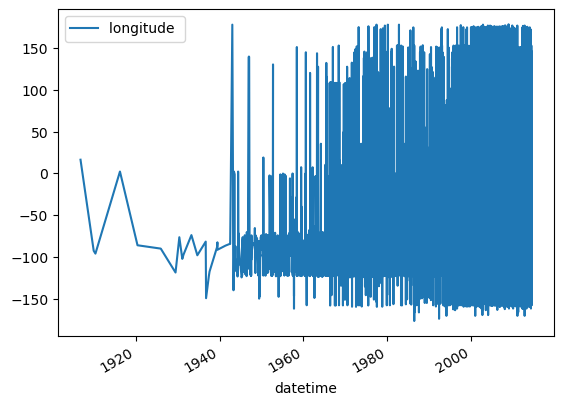

In [21]:
ufo_ts.plot()#y='duration (seconds)')

> Hmmmm.... what are we *trying* to visualize?

We see every numeric feature on the graph, but some are missing!

In [22]:
ufo_ts.info()
ufo_ts.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 80332 entries, 1949-10-10 20:30:00 to 2013-09-09 23:00:00
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   city                  80332 non-null  object 
 1   state                 74535 non-null  object 
 2   country               70662 non-null  object 
 3   shape                 78400 non-null  object 
 4   duration (seconds)    80332 non-null  object 
 5   duration (hours/min)  80332 non-null  object 
 6   comments              80317 non-null  object 
 7   date posted           80332 non-null  object 
 8   latitude              80332 non-null  object 
 9   longitude             80332 non-null  float64
dtypes: float64(1), object(9)
memory usage: 6.7+ MB


,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
datetime,,,,,,,,,,
1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111
1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
1956-10-10 21:00:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
1960-10-10 20:00:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611


- "Duration(Seconds)" and "latitude" be numeric.

In [23]:
try:
    ufo_ts['latitude'] =  ufo_ts['latitude'].astype(float)
except Exception as e:
    display(e)

ValueError("could not convert string to float: '33q.200088'")

In [24]:
coerced_latitude = pd.to_numeric(ufo_ts['latitude'], errors='coerce')
coerced_latitude.isna().sum()

1

In [25]:
# let's use coerce - 1 row is fine to lose
ufo_ts['latitude'] = pd.to_numeric(ufo_ts['latitude'], errors='coerce')
ufo_ts

,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
datetime,,,,,,,,,,
1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111
1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082
1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667
1956-10-10 21:00:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833
1960-10-10 20:00:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611
...,...,...,...,...,...,...,...,...,...,...
2013-09-09 21:15:00,nashville,tn,us,light,600,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444
2013-09-09 22:00:00,boise,id,us,circle,1200,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500
2013-09-09 22:00:00,napa,ca,us,other,1200,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444


In [26]:
## Need to convert duration to numeric 
# ufo_ts['duration (seconds)'] = 
duration_coerced = pd.to_numeric(ufo_ts['duration (seconds)'], errors='coerce')#.astype(float)
duration_coerced.isna().sum()
# ufo_ts

3

In [27]:
ufo_ts[duration_coerced.isna()]

,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
datetime,,,,,,,,,,
2000-02-02 19:33:00,bouse,az,us,NaN,2`,each a few seconds,Driving through Plomosa Pass towards Bouse Loo...,2/16/2000,33.932500,-114.005000
2005-04-10 22:52:00,santa cruz,ca,us,NaN,8`,eight seconds,2 red lights moving together and apart with a ...,4/16/2005,36.974167,-122.029722
2006-07-21 13:00:00,ibague (colombia),NaN,NaN,circle,0.5`,1/2 segundo,Viajaba a 27.000 pies en un avion comercial ve...,10/30/2006,4.440663,-75.244141


In [28]:
## Need to convert duration to numeric 
# ufo_ts['duration (seconds)'] = ufo_ts['duration (seconds)'].str.replace('`','')
ufo_ts['duration (seconds)'] = pd.to_numeric(ufo_ts['duration (seconds)'], errors='coerce')
ufo_ts.info()
ufo_ts.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 80332 entries, 1949-10-10 20:30:00 to 2013-09-09 23:00:00
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   city                  80332 non-null  object 
 1   state                 74535 non-null  object 
 2   country               70662 non-null  object 
 3   shape                 78400 non-null  object 
 4   duration (seconds)    80329 non-null  float64
 5   duration (hours/min)  80332 non-null  object 
 6   comments              80317 non-null  object 
 7   date posted           80332 non-null  object 
 8   latitude              80331 non-null  float64
 9   longitude             80332 non-null  float64
dtypes: float64(3), object(7)
memory usage: 6.7+ MB


,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
datetime,,,,,,,,,,
1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111
1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082
1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667
1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833
1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611


In [29]:
ufo_ts.isna().sum()

city                       0
state                   5797
country                 9670
shape                   1932
duration (seconds)         3
duration (hours/min)       0
comments                  15
date posted                0
latitude                   1
longitude                  0
dtype: int64

In [30]:
ufo_ts = ufo_ts.dropna(subset=['latitude','duration (seconds)'])
ufo_ts

,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
datetime,,,,,,,,,,
1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111
1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082
1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667
1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833
1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611
...,...,...,...,...,...,...,...,...,...,...
2013-09-09 21:15:00,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444
2013-09-09 22:00:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500
2013-09-09 22:00:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444


In [31]:
ufo_ts.sort_index()

,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
datetime,,,,,,,,,,
1906-11-11 00:00:00,wien (austria),NaN,NaN,other,10800.0,3 h,The oldest professional photo of a UFO object ...,12/23/2002,48.208174,16.373819
1910-01-01 23:59:00,kirksville (near),mo,us,disk,120.0,minutes,Historical sighting (1903 - 1913) Northern Mis...,9/15/2005,40.194722,-92.583056
1910-06-01 15:00:00,wills point,tx,us,cigar,120.0,2 minutes,Cigar shaped object moving from West to East,4/16/2005,32.709167,-96.008056
1916-04-05 13:00:00,france (above; from aircraft),NaN,NaN,cigar,60.0,about 1 min.,((NUFORC Note: Possible hoax. PD)) Saw 3 ci...,3/9/2004,46.227638,2.213749
1920-06-11 21:00:00,cicero,in,us,unknown,60.0,1 minute,((NUFORC Note: Probable hoax. Note date. PD...,5/12/2009,40.123889,-86.013333
...,...,...,...,...,...,...,...,...,...,...
2014-05-07 21:10:00,naugatuck,ct,us,unknown,300.0,5 minutes,Large formation of lights in western sky&#44 f...,5/8/2014,41.485833,-73.051111
2014-05-07 21:20:00,hillsboro,mo,us,fireball,360.0,4-6 minutes,Round slow moving silent ball looked like a ca...,5/8/2014,38.232222,-90.562778
2014-05-07 23:30:00,san isidro,nm,NaN,unknown,15.0,15 seconds,2 red lights gliding across sky&#44 then green...,5/8/2014,35.563363,-106.770591


In [32]:
# ufo_ts.sort_values('date posted')

### Visualizing After Cleaning

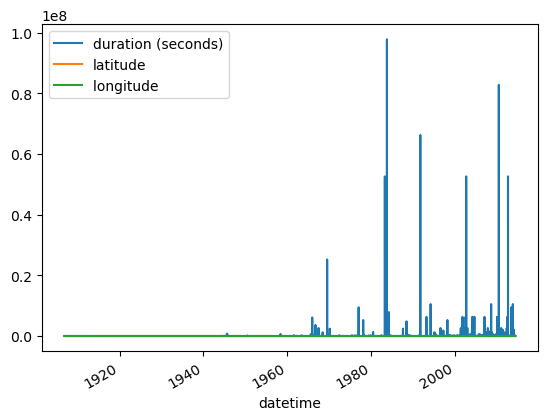

In [33]:
ufo_ts.select_dtypes('number').plot();

In [34]:
ufo_ts.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 80328 entries, 1949-10-10 20:30:00 to 2013-09-09 23:00:00
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   city                  80328 non-null  object 
 1   state                 74532 non-null  object 
 2   country               70660 non-null  object 
 3   shape                 78398 non-null  object 
 4   duration (seconds)    80328 non-null  float64
 5   duration (hours/min)  80328 non-null  object 
 6   comments              80313 non-null  object 
 7   date posted           80328 non-null  object 
 8   latitude              80328 non-null  float64
 9   longitude             80328 non-null  float64
dtypes: float64(3), object(7)
memory usage: 6.7+ MB


<AxesSubplot: xlabel='datetime'>

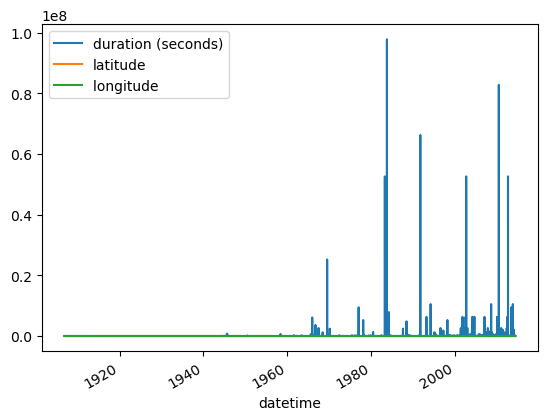

In [35]:
ufo_ts.plot()

### What do we really want to know about UFO's? 
- Duration of sighting?
- Location of sighting?
- Number of sightings?

# 🕹️Part 2) Time Series Statistics 

## Getting Our Time Series of UFO Sightings

- We want to quantify the number of events that occurred within each interval.

>- Q: How could we do this? (there's several ways)


In [36]:
## A.1) Add a count column with a value of 1 for each row and then use reasmple().sum()
demo_ts = ufo_ts.copy() 
demo_ts['Count'] = 1
demo_ts

,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,Count
datetime,,,,,,,,,,,
1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1
1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082,1
1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667,1
1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1
1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1
...,...,...,...,...,...,...,...,...,...,...,...
2013-09-09 21:15:00,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444,1
2013-09-09 22:00:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500,1
2013-09-09 22:00:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444,1


In [37]:
# A.2) 
demo_ts.resample('D').sum()#['Count']

/var/folders/rf/vw4r41jd7vd95x1w0dth7v9h0000gp/T/ipykernel_2594/2363162109.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  demo_ts.resample('D').sum()#['Count']


,duration (seconds),latitude,longitude,Count
datetime,,,,
1906-11-11,10800.0,48.208174,16.373819,1
1906-11-12,0.0,0.000000,0.000000,0
1906-11-13,0.0,0.000000,0.000000,0
1906-11-14,0.0,0.000000,0.000000,0
1906-11-15,0.0,0.000000,0.000000,0
...,...,...,...,...
2014-05-04,9707.0,279.889308,-711.047882,8
2014-05-05,17235.0,481.917411,-1277.858485,13
2014-05-06,6312.0,451.135555,-968.804722,12


In [38]:
## B) use .size
ufo_ts.resample("D").size()

datetime
1906-11-11     1
1906-11-12     0
1906-11-13     0
1906-11-14     0
1906-11-15     0
              ..
2014-05-04     8
2014-05-05    13
2014-05-06    12
2014-05-07    13
2014-05-08     2
Freq: D, Length: 39261, dtype: int64

### Make `ts` from ufo_ts

In [39]:
ts = ufo_ts.resample('D').size()
ts

datetime
1906-11-11     1
1906-11-12     0
1906-11-13     0
1906-11-14     0
1906-11-15     0
              ..
2014-05-04     8
2014-05-05    13
2014-05-06    12
2014-05-07    13
2014-05-08     2
Freq: D, Length: 39261, dtype: int64

In [40]:
plt.rcParams['figure.figsize'] = [10,5]

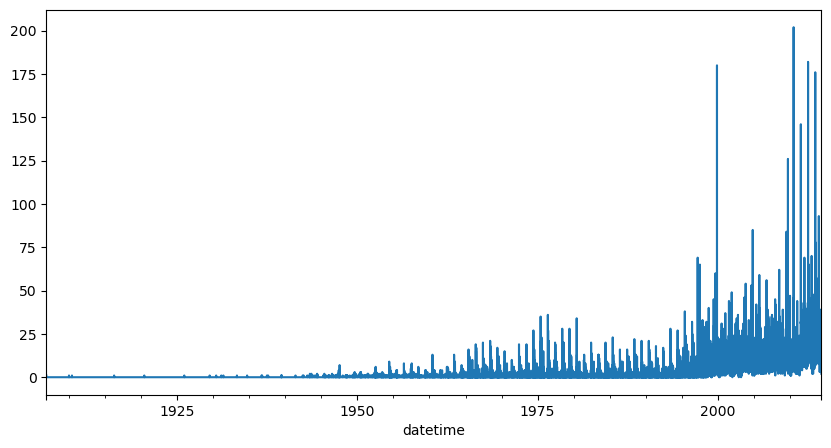

In [41]:
ts.plot();

> Let's keep data from 1950 to present day

In [42]:
ts = ts.loc["1950":]
ts

datetime
1950-01-01     0
1950-01-02     1
1950-01-03     0
1950-01-04     0
1950-01-05     0
              ..
2014-05-04     8
2014-05-05    13
2014-05-06    12
2014-05-07    13
2014-05-08     2
Freq: D, Length: 23504, dtype: int64

<AxesSubplot: xlabel='datetime'>

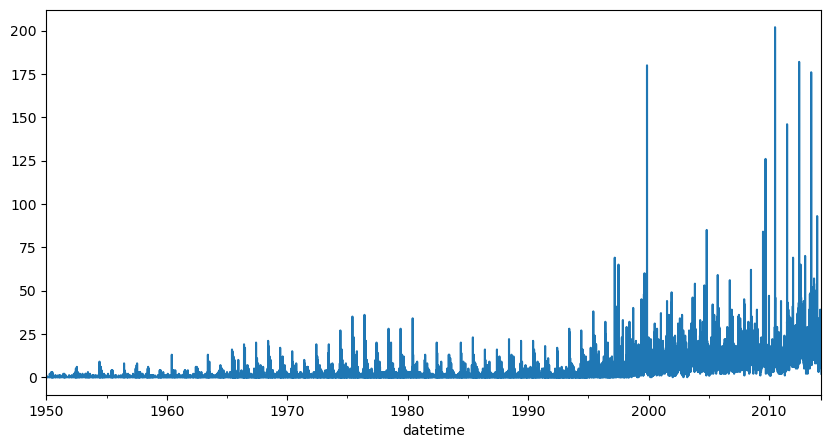

In [43]:
ts.plot()

## Rolling Statistics

- Let's get a smoother curve by taking a 7-day moving average.  
- With pandas, we use the `.rolling()` method to calculating moving(rolling) statistics

In [44]:
ts

datetime
1950-01-01     0
1950-01-02     1
1950-01-03     0
1950-01-04     0
1950-01-05     0
              ..
2014-05-04     8
2014-05-05    13
2014-05-06    12
2014-05-07    13
2014-05-08     2
Freq: D, Length: 23504, dtype: int64

In [45]:
## try using .rolling(7)
ts.rolling(7)

Rolling [window=7,center=False,axis=0,method=single]

In [46]:
ts_ma = ts.rolling(7).mean()
ts_ma

datetime
1950-01-01          NaN
1950-01-02          NaN
1950-01-03          NaN
1950-01-04          NaN
1950-01-05          NaN
                ...    
2014-05-04    16.857143
2014-05-05    17.571429
2014-05-06    17.285714
2014-05-07    17.000000
2014-05-08    12.714286
Freq: D, Length: 23504, dtype: float64

In [47]:
## View the first 10 rows and look for null values
ts_ma.head(10)

datetime
1950-01-01         NaN
1950-01-02         NaN
1950-01-03         NaN
1950-01-04         NaN
1950-01-05         NaN
1950-01-06         NaN
1950-01-07    0.142857
1950-01-08    0.142857
1950-01-09    0.000000
1950-01-10    0.000000
Freq: D, dtype: float64

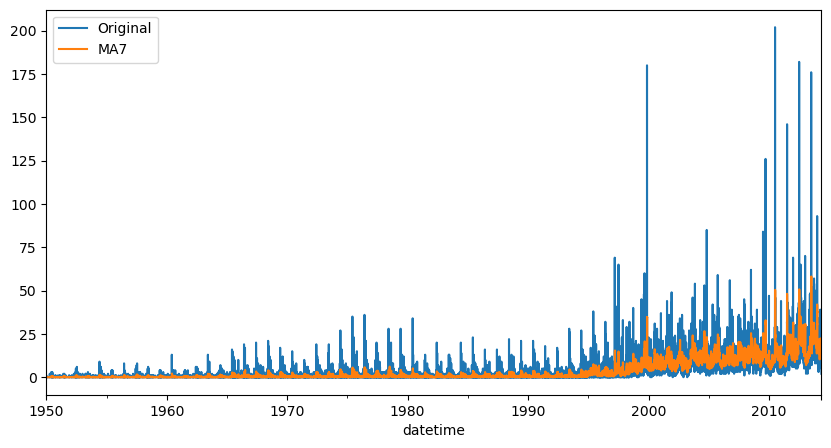

In [48]:
## compare the original vs ma

ax = ts.plot(label='Original');
ts_ma.plot(ax=ax, label='MA7');
ax.legend();

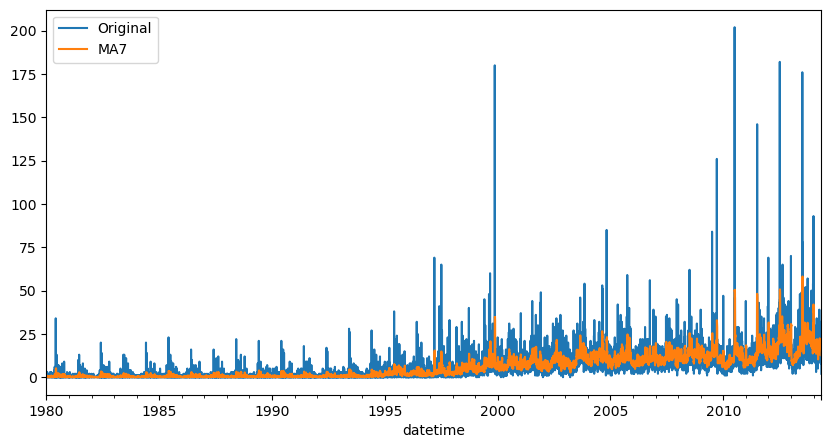

In [49]:
## Let's zoom in a bit to see the differences better
date_slice = pd.IndexSlice["1980":]

ax = ts.loc[date_slice].plot(label='Original');
ts_ma.loc[date_slice].plot(ax=ax, label='MA7');
ax.legend();

## Resampling

- Daily data for such a long time series is going to be very noisy. 
- We should consider downsampling to another frequency that is more appropriate for visualizing the # of sightings over a long period of time.
- Let's test some of our other options:

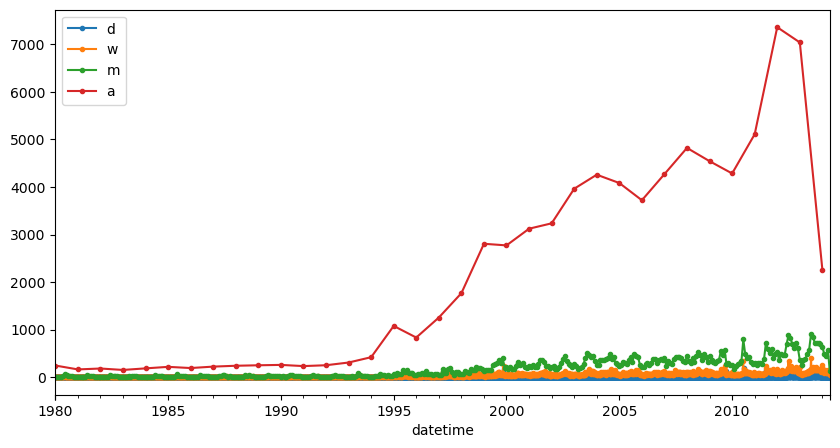

In [50]:
## Frequencies to compare
freqs = ['d','w','m','a']

for freq in freqs:
    ts_temp = ts.loc[date_slice].resample(freq).sum()
    ts_temp.plot(label=freq, style='.-')
plt.legend()

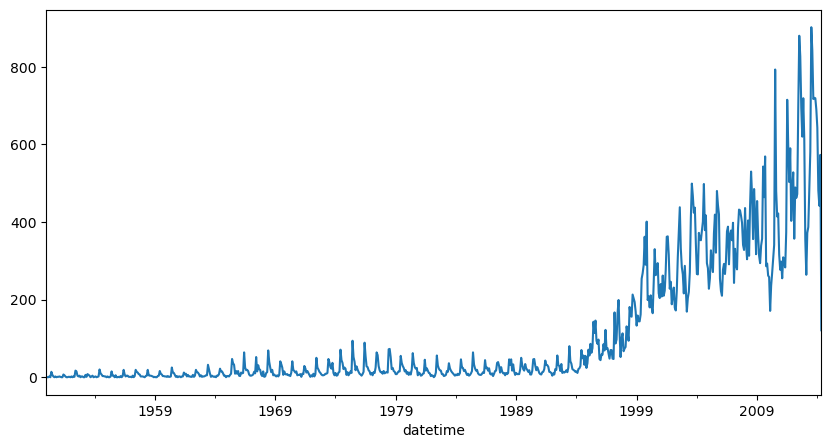

In [51]:
## save our new frequency ts and plot
ts_m = ts.resample("M").sum()
ts_m.plot();

In [52]:
# Let's taking a 3-month moving average and compare

ts_m_ma = ts_m.rolling(4).mean()
ts_m_ma

datetime
1950-01-31       NaN
1950-02-28       NaN
1950-03-31       NaN
1950-04-30      0.75
1950-05-31      0.50
               ...  
2014-01-31    693.00
2014-02-28    633.25
2014-03-31    564.00
2014-04-30    534.75
2014-05-31    404.25
Freq: M, Length: 773, dtype: float64

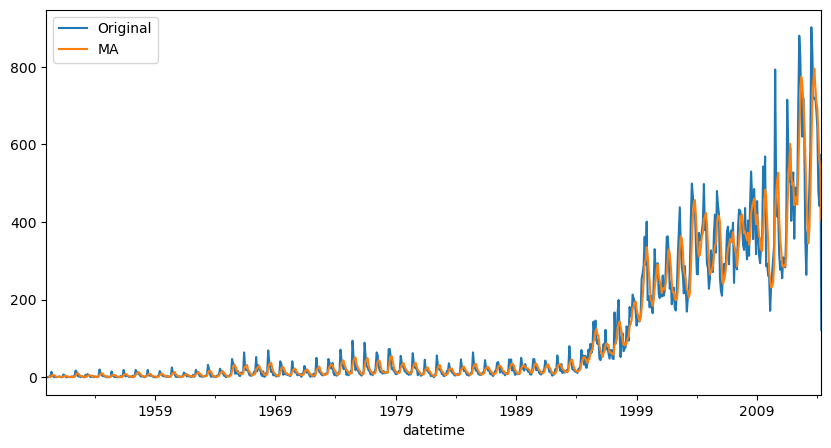

In [53]:
## compare the original vs ma

ax = ts_m.plot(label='Original');
ts_m_ma.plot(ax=ax, label='MA');
ax.legend();

## Seasonality

In [54]:
import statsmodels.tsa.api as tsa

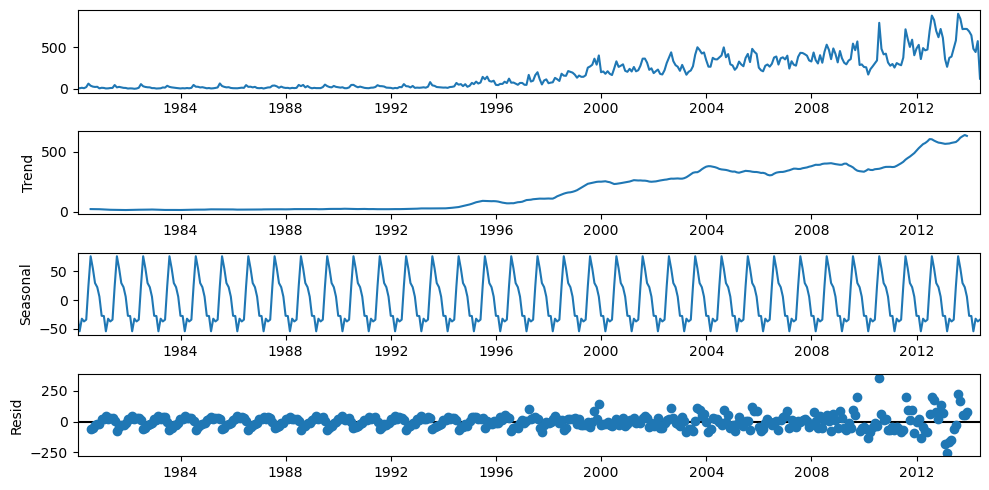

In [55]:
decomp = tsa.seasonal_decompose(ts_m.loc[date_slice])
decomp.plot();

In [56]:
decomp.seasonal

datetime
1980-01-31   -27.747636
1980-02-29   -54.203444
1980-03-31   -32.383999
1980-04-30   -37.140312
1980-05-31   -34.041828
                ...    
2014-01-31   -27.747636
2014-02-28   -54.203444
2014-03-31   -32.383999
2014-04-30   -37.140312
2014-05-31   -34.041828
Freq: M, Name: seasonal, Length: 413, dtype: float64

# 🕹️Part 3) Aggregating Full Dataset Using Date Parts

In [57]:
## making eda_df with date as a column instead of index
eda_df = ufo_ts.reset_index()
eda_df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111
1,1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082
2,1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667
3,1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833
4,1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611
...,...,...,...,...,...,...,...,...,...,...,...
80323,2013-09-09 21:15:00,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444
80324,2013-09-09 22:00:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500
80325,2013-09-09 22:00:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444
80326,2013-09-09 22:20:00,vienna,va,us,circle,5.0,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.901111,-77.265556


In [58]:
eda_df['datetime']

0       1949-10-10 20:30:00
1       1949-10-10 21:00:00
2       1955-10-10 17:00:00
3       1956-10-10 21:00:00
4       1960-10-10 20:00:00
                ...        
80323   2013-09-09 21:15:00
80324   2013-09-09 22:00:00
80325   2013-09-09 22:00:00
80326   2013-09-09 22:20:00
80327   2013-09-09 23:00:00
Name: datetime, Length: 80328, dtype: datetime64[ns]

### Feature Engineering: Date Parts

- Datetime objects have:
    - year
    - month
    - month_name()
    - day
    - day_name()
    - hour
    - seconds
    
- Pandas has a `.dt.` accessor to use datetime methods on an entire column at once.

In [59]:
eda_df['datetime'].dt.year

0        1949
1        1949
2        1955
3        1956
4        1960
         ... 
80323    2013
80324    2013
80325    2013
80326    2013
80327    2013
Name: datetime, Length: 80328, dtype: int64

In [60]:
## feature engineering for dates
eda_df['year'] = eda_df['datetime'].dt.year
eda_df['month'] = eda_df['datetime'].dt.month_name()
eda_df['day of month'] = eda_df['datetime'].dt.day
eda_df['day of week'] = eda_df['datetime'].dt.day_name()
eda_df['hour'] = eda_df['datetime'].dt.hour
eda_df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year,month,day of month,day of week,hour
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949,October,10,Monday,20
1,1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082,1949,October,10,Monday,21
2,1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667,1955,October,10,Monday,17
3,1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956,October,10,Wednesday,21
4,1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960,October,10,Monday,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80323,2013-09-09 21:15:00,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444,2013,September,9,Monday,21
80324,2013-09-09 22:00:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500,2013,September,9,Monday,22
80325,2013-09-09 22:00:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444,2013,September,9,Monday,22
80326,2013-09-09 22:20:00,vienna,va,us,circle,5.0,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.901111,-77.265556,2013,September,9,Monday,22


> Let's add a "weekend" feature that will be True if the day was a Saturday or Sunday.

In [61]:
## let's add a weekend feature
eda_df['weekend'] = eda_df['day of week'].isin(['Saturday','Sunday'])
eda_df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year,month,day of month,day of week,hour,weekend
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949,October,10,Monday,20,False
1,1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082,1949,October,10,Monday,21,False
2,1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667,1955,October,10,Monday,17,False
3,1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956,October,10,Wednesday,21,False
4,1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960,October,10,Monday,20,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80323,2013-09-09 21:15:00,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444,2013,September,9,Monday,21,False
80324,2013-09-09 22:00:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500,2013,September,9,Monday,22,False
80325,2013-09-09 22:00:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444,2013,September,9,Monday,22,False
80326,2013-09-09 22:20:00,vienna,va,us,circle,5.0,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.901111,-77.265556,2013,September,9,Monday,22,False


> Let's add a column for the decade

In [62]:
## 
eda_df['decade'] = eda_df['year'] - eda_df['year']%10
eda_df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year,month,day of month,day of week,hour,weekend,decade
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949,October,10,Monday,20,False,1940
1,1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082,1949,October,10,Monday,21,False,1940
2,1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667,1955,October,10,Monday,17,False,1950
3,1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956,October,10,Wednesday,21,False,1950
4,1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960,October,10,Monday,20,False,1960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80323,2013-09-09 21:15:00,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444,2013,September,9,Monday,21,False,2010
80324,2013-09-09 22:00:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500,2013,September,9,Monday,22,False,2010
80325,2013-09-09 22:00:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444,2013,September,9,Monday,22,False,2010
80326,2013-09-09 22:20:00,vienna,va,us,circle,5.0,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.901111,-77.265556,2013,September,9,Monday,22,False,2010


### Feature Engineering: Holidays

In [63]:
# !pip install holidays
import holidays
import datetime as dt
from holidays import country_holidays

In [64]:
## Create an instance of the US country holidays.
us_holidays = country_holidays('US')
us_holidays

holidays.country_holidays('US')

In [65]:
test = "01/01/2015"
test

'01/01/2015'

In [66]:
us_holidays.get(test)

"New Year's Day"

In [67]:
## Saving both holiday types as columns
eda_df["US Holiday"] = eda_df['datetime'].map(us_holidays.get)
eda_df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year,month,day of month,day of week,hour,weekend,decade,US Holiday
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949,October,10,Monday,20,False,1940,None
1,1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082,1949,October,10,Monday,21,False,1940,None
2,1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667,1955,October,10,Monday,17,False,1950,None
3,1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956,October,10,Wednesday,21,False,1950,None
4,1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960,October,10,Monday,20,False,1960,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80323,2013-09-09 21:15:00,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444,2013,September,9,Monday,21,False,2010,None
80324,2013-09-09 22:00:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500,2013,September,9,Monday,22,False,2010,None
80325,2013-09-09 22:00:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444,2013,September,9,Monday,22,False,2010,None
80326,2013-09-09 22:20:00,vienna,va,us,circle,5.0,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.901111,-77.265556,2013,September,9,Monday,22,False,2010,None


In [68]:
eda_df['US Holiday'].unique()

array([None, 'Columbus Day', 'Veterans Day', 'Veterans Day (Observed)',
       "New Year's Day", 'Thanksgiving', 'Martin Luther King Jr. Day',
       "New Year's Day (Observed)", 'Christmas Day (Observed)',
       'Christmas Day', "Washington's Birthday", 'Memorial Day',
       'Independence Day (Observed)', 'Independence Day', 'Labor Day'],
      dtype=object)

## Answering Stakeholder Questions

In [69]:
eda_ts = eda_df.set_index('datetime')
eda_ts

,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year,month,day of month,day of week,hour,weekend,decade,US Holiday
datetime,,,,,,,,,,,,,,,,,,
1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949,October,10,Monday,20,False,1940,None
1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082,1949,October,10,Monday,21,False,1940,None
1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667,1955,October,10,Monday,17,False,1950,None
1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956,October,10,Wednesday,21,False,1950,None
1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960,October,10,Monday,20,False,1960,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-09-09 21:15:00,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444,2013,September,9,Monday,21,False,2010,None
2013-09-09 22:00:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500,2013,September,9,Monday,22,False,2010,None
2013-09-09 22:00:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444,2013,September,9,Monday,22,False,2010,None


In [70]:
## Remaking our count time series
ts = eda_df.set_index("datetime").resample("M").size()
ts = ts.loc["1950":]
ts

datetime
1950-01-31      1
1950-02-28      0
1950-03-31      0
1950-04-30      2
1950-05-31      0
             ... 
2014-01-31    643
2014-02-28    481
2014-03-31    442
2014-04-30    573
2014-05-31    121
Freq: M, Length: 773, dtype: int64

### 1) What Month/Year had the most sightings? (and how many sightings were there?)

In [71]:
date_most_ufos = ts.idxmax()
date_most_ufos

Timestamp('2013-07-31 00:00:00', freq='M')

In [72]:
ts.loc[date_most_ufos]

902

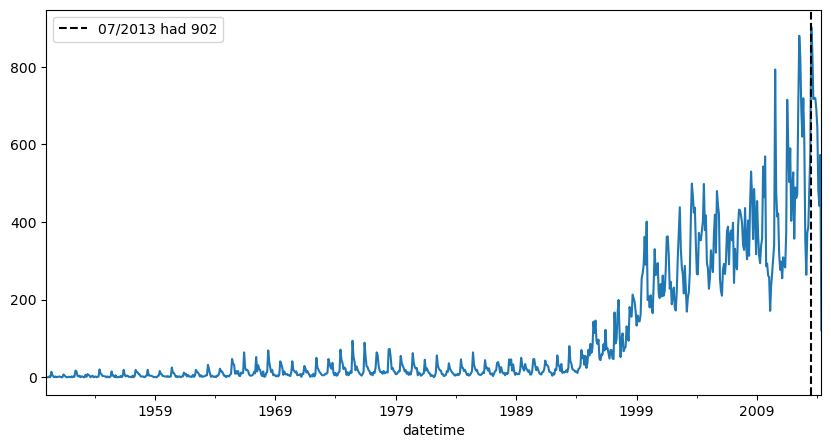

In [73]:
ax = ts.plot();
fmt = "%m/%Y"
ax.axvline(date_most_ufos, ls='--',color='k', 
           label=f"{date_most_ufos.strftime(fmt)} had {ts.loc[date_most_ufos]}")
ax.legend()

### 2) Which month of the year has the highest number of reported sightings?

In [74]:
eda_ts['month'].value_counts()

July         9519
August       8636
June         8152
September    7589
October      7407
November     6739
January      5689
December     5665
April        5526
March        5450
May          5292
February     4664
Name: month, dtype: int64

In [75]:
# ax = sns.countplot(data=eda_df,x='month')
# ax.tick_params(axis='x',labelrotation=45)#,ha='center')

### 3) What day of the week has the highest reported sightings?

In [76]:
eda_ts['day of week'].value_counts(1)

Saturday     0.175107
Sunday       0.146848
Friday       0.144470
Thursday     0.137312
Wednesday    0.136665
Tuesday      0.134312
Monday       0.125286
Name: day of week, dtype: float64

### 🔥 4) Which US State has seen then biggest % increase in sightings since 1990?

In [77]:
states_ts = eda_ts.groupby("state").resample("A").size()
states_ts

state  datetime  
ab     1952-12-31    1
       1953-12-31    0
       1954-12-31    0
       1955-12-31    0
       1956-12-31    1
                    ..
yt     2010-12-31    0
       2011-12-31    0
       2012-12-31    0
       2013-12-31    0
       2014-12-31    2
Length: 4477, dtype: int64

In [78]:
states_df = states_ts.unstack(0)
states_df = states_df.fillna(0)
states_df

state,ab,ak,al,ar,az,bc,ca,co,ct,dc,...,tx,ut,va,vt,wa,wi,wv,wy,yk,yt
datetime,,,,,,,,,,,,,,,,,,,,,
1910-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1911-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1912-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1913-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1914-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-12-31,19.0,13.0,25.0,39.0,109.0,17.0,545.0,63.0,62.0,9.0,...,207.0,37.0,71.0,13.0,252.0,58.0,16.0,11.0,0.0,0.0
2011-12-31,15.0,17.0,37.0,41.0,150.0,20.0,577.0,107.0,70.0,7.0,...,235.0,51.0,97.0,21.0,277.0,104.0,25.0,21.0,0.0,0.0
2012-12-31,17.0,43.0,55.0,52.0,194.0,28.0,674.0,107.0,146.0,12.0,...,232.0,102.0,132.0,54.0,389.0,147.0,59.0,12.0,0.0,0.0


In [79]:
states_df.loc['1990']

state,ab,ak,al,ar,az,bc,ca,co,ct,dc,...,tx,ut,va,vt,wa,wi,wv,wy,yk,yt
datetime,,,,,,,,,,,,,,,,,,,,,
1990-12-31,1.0,3.0,0.0,2.0,7.0,3.0,37.0,4.0,2.0,0.0,...,14.0,2.0,4.0,0.0,8.0,7.0,0.0,0.0,0.0,0.0


In [80]:
state_pct_change = (states_df.iloc[-1] -  states_df.loc["1990-12-31"]) /  states_df.loc["1990-12-31"]
state_pct_change.sort_values()

state
pr   -1.00
pq   -1.00
ne   -1.00
pe   -1.00
de    0.25
      ... 
yt     inf
nf     NaN
nt     NaN
sa     NaN
yk     NaN
Length: 67, dtype: float64

### 5) Which US holiday has the largest number of sightings?

In [81]:
eda_ts['US Holiday'].value_counts()

Independence Day               1208
New Year's Day                  676
Thanksgiving                    260
Christmas Day                   243
Columbus Day                    218
Veterans Day                    215
Labor Day                       198
Memorial Day                    168
Washington's Birthday           166
Martin Luther King Jr. Day      145
New Year's Day (Observed)        69
Veterans Day (Observed)          66
Independence Day (Observed)      62
Christmas Day (Observed)         52
Name: US Holiday, dtype: int64

<AxesSubplot: xlabel='count', ylabel='US Holiday'>

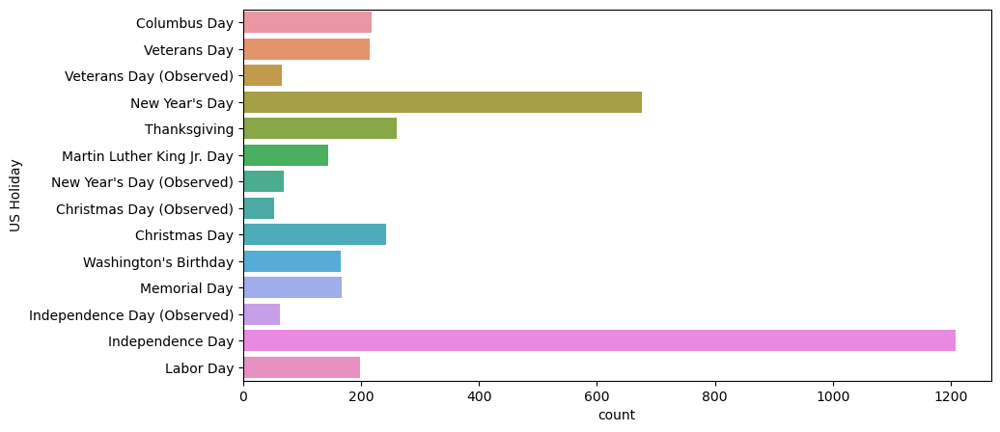

In [105]:
sns.countplot(data=eda_ts, y='US Holiday')

In [93]:
ts

datetime
1950-01-31      1
1950-02-28      0
1950-03-31      0
1950-04-30      2
1950-05-31      0
             ... 
2014-01-31    643
2014-02-28    481
2014-03-31    442
2014-04-30    573
2014-05-31    121
Freq: M, Length: 773, dtype: int64

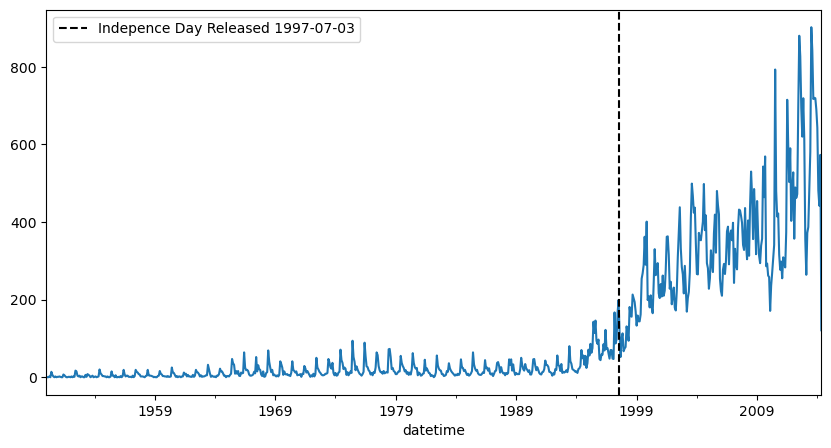

In [102]:
ax = ts.plot()
rel_date= '1997-07-03'
# rel_date = '1997-05-26'
ax.axvline(rel_date, label=f'Indepence Day Released {rel_date}',
          ls='--',color='k');
ax.legend();

### 6) Which country had the largest proportion of sightings for the year 2000?

In [82]:
eda_ts.loc['2000','country'].value_counts()

us    2183
ca     102
gb      78
au      22
de       3
Name: country, dtype: int64

### 7) Have the types/shapes of UFO's witness changed over time?

In [83]:
eda_ts['shape'].value_counts()

light        16565
triangle      7865
circle        7607
fireball      6208
other         5649
unknown       5584
sphere        5387
disk          5213
oval          3733
formation     2457
cigar         2057
changing      1962
flash         1328
rectangle     1296
cylinder      1283
diamond       1178
chevron        952
egg            759
teardrop       750
cone           316
cross          233
delta            7
round            2
crescent         2
pyramid          1
flare            1
hexagon          1
dome             1
changed          1
Name: shape, dtype: int64

In [84]:
ts_shapes = eda_ts.groupby('shape').resample("M").size()
ts_shapes

shape     datetime  
changed   1996-06-30     1
changing  1954-07-31     1
          1954-08-31     0
          1954-09-30     0
          1954-10-31     0
                        ..
unknown   2014-01-31    39
          2014-02-28    37
          2014-03-31    40
          2014-04-30    38
          2014-05-31     8
Length: 19344, dtype: int64

In [85]:
ts_shapes = ts_shapes.unstack(0).fillna(0)
ts_shapes

shape,changed,changing,chevron,cigar,circle,cone,crescent,cross,cylinder,delta,...,light,other,oval,pyramid,rectangle,round,sphere,teardrop,triangle,unknown
datetime,,,,,,,,,,,,,,,,,,,,,
1906-11-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1906-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1907-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1907-02-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1907-03-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-01-31,0.0,14.0,4.0,9.0,78.0,2.0,0.0,0.0,6.0,0.0,...,141.0,34.0,22.0,0.0,6.0,0.0,61.0,9.0,50.0,39.0
2014-02-28,0.0,10.0,5.0,10.0,66.0,4.0,0.0,4.0,7.0,0.0,...,108.0,32.0,26.0,0.0,1.0,0.0,33.0,1.0,39.0,37.0
2014-03-31,0.0,4.0,6.0,5.0,51.0,1.0,0.0,1.0,3.0,0.0,...,91.0,26.0,20.0,0.0,9.0,0.0,33.0,6.0,55.0,40.0


<AxesSubplot: xlabel='datetime'>

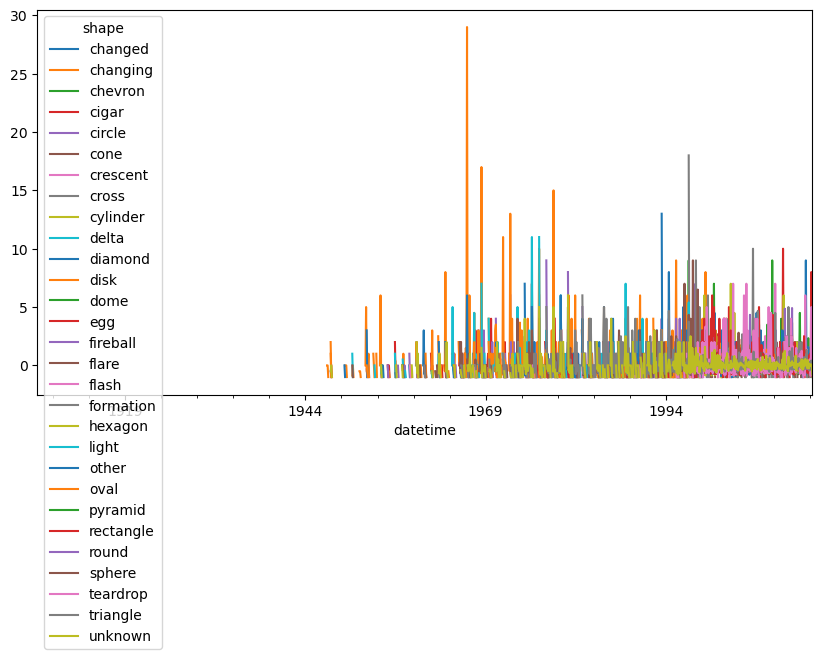

In [86]:
ts_shapes.pct_change().plot()

# Bonus: Plotly Express

In [87]:
import plotly.express as px

In [88]:
eda_df = eda_df.sort_values('decade')

In [89]:
try:
    px.scatter_geo(data_frame=eda_df, lat='latitude',lon='longitude', animation_frame="decade")
except Exception as e:
    display(e)

ValueError("Value of 'lon' is not the name of a column in 'data_frame'. Expected one of ['datetime', 'city', 'state', 'country', 'shape', 'duration (seconds)', 'duration (hours/min)', 'comments', 'date posted', 'latitude', 'longitude ', 'year', 'month', 'day of month', 'day of week', 'hour', 'weekend', 'decade', 'US Holiday'] but received: longitude")

In [90]:
eda_df.columns = eda_df.columns.str.strip()
eda_df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year,month,day of month,day of week,hour,weekend,decade,US Holiday
7863,1906-11-11 00:00:00,wien (austria),NaN,NaN,other,10800.0,3 h,The oldest professional photo of a UFO object ...,12/23/2002,48.208174,16.373819,1906,November,11,Sunday,0,True,1900,None
10580,1910-01-01 23:59:00,kirksville (near),mo,us,disk,120.0,minutes,Historical sighting (1903 - 1913) Northern Mis...,9/15/2005,40.194722,-92.583056,1910,January,1,Saturday,23,True,1910,New Year's Day
46855,1910-06-01 15:00:00,wills point,tx,us,cigar,120.0,2 minutes,Cigar shaped object moving from West to East,4/16/2005,32.709167,-96.008056,1910,June,1,Wednesday,15,False,1910,None
40273,1916-04-05 13:00:00,france (above; from aircraft),NaN,NaN,cigar,60.0,about 1 min.,((NUFORC Note: Possible hoax. PD)) Saw 3 ci...,3/9/2004,46.227638,2.213749,1916,April,5,Wednesday,13,False,1910,None
62756,1929-07-05 14:00:00,buchanan (or burns),or,us,disk,60.0,1min,we were traveling east of burns&#44clmbing up ...,8/16/2002,43.642500,-118.627500,1929,July,5,Friday,14,False,1920,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60511,2013-07-28 22:40:00,langley (canada),bc,ca,triangle,20.0,20 seconds,A triangular shaped craft appeared in the nigh...,8/30/2013,49.100000,-122.650000,2013,July,28,Sunday,22,True,2010,None
60510,2013-07-28 22:35:00,cedar rapids,ia,us,light,30.0,30 seconds,Slow white glow across sky in 20 seconds,8/30/2013,42.008333,-91.643889,2013,July,28,Sunday,22,True,2010,None
60509,2013-07-28 22:20:00,orrington,me,us,circle,600.0,5-10 minutes,20 plus amber colored objects in formation ove...,8/30/2013,44.731111,-68.826944,2013,July,28,Sunday,22,True,2010,None
29801,2011-02-07 03:00:00,piranguinho (brazil),mn,NaN,flash,2400.0,40 minutos,SOU POLICIAL NO BRAZIL&#44 EU E MEU FILHO QUE...,8/7/2011,46.729553,-94.685900,2011,February,7,Monday,3,False,2010,None


In [91]:
px.scatter_geo(data_frame=eda_df, lat='latitude',lon='longitude', animation_frame="year")
